<a href="https://colab.research.google.com/github/kRuvpin/KCBV_Mamang/blob/main/citra5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# upload file yang sudah diunduh
# file akan disimpan sesuai dengan nama file yang diunggah
from google.colab import files
file = files.upload()
#lowpass filter
# memanggil modul yang diperlukan
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow


#bgr
img = cv2.imread('eliana.jpeg')

#rgb
cat = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# tampilkan gambar awal tanpa filter
cv2_imshow(img)


# membuat filter: matriks berukuran 5 x 5 
kernel = np.ones((5,5),np.float32)/25
print(kernel)

# lakukan filtering
kucing_filter = cv2.filter2D(img,-1,kernel)

cv2_imshow(kucing_filter)
# perbesar ukuran hasil plotting jika diperlukan
plt.rcParams["figure.figsize"] = (15,15)

# plot pertama, gambar asli
plt.subplot(121),plt.imshow(cat),plt.title('Original')
plt.xticks([]), plt.yticks([])

# kedua, hasil filter
plt.subplot(122),plt.imshow(kucing_filter),
plt.title('Averaging')
plt.xticks([]), plt.yticks([])

# Plot!
plt.show()
batman_blur = cv2.blur(img,(5,5))

cv2_imshow(batman_blur)
# ini adalah cara lain untuk membuat sebuah kernel, 
# yaitu dengan menggunakan np.matrix
# kali ini, ukuran matriksnya 3 x 3
kernel = np.matrix([
          [1, 1, 1],
          [1, 2, 1],
          [1, 1, 1]         
          ])/25
print(kernel)

# buat lagi filteringnya
kucing_filter = cv2.filter2D(img,-1,kernel)

# tampilkan
cv2_imshow(kucing_filter)
# perbesar ukuran hasil plotting jika diperlukan
plt.rcParams["figure.figsize"] = (15,15)

# plot pertama, gambar asli
plt.subplot(121),plt.imshow(cat),plt.title('Original')
plt.xticks([]), plt.yticks([])

# kedua, hasil filter
plt.subplot(122),plt.imshow(kucing_filter),
plt.title('Averaging')
plt.xticks([]), plt.yticks([])

# Plot!
plt.show()
batman_blur = cv2.blur(img,(5,5))

cv2_imshow(batman_blur)
# ini adalah cara lain untuk membuat sebuah kernel, 
# yaitu dengan menggunakan np.matrix
# kali ini, ukuran matriksnya 3 x 3
kernel = np.matrix([
          [1, 1, 1],
          [1, 2, 1],
          [1, 1, 1]         
          ])/25
print(kernel)

# buat lagi filteringnya
kucing_filter = cv2.filter2D(img,-1,kernel)

# tampilkan
cv2_imshow(kucing_filter)
# memanggil citra sebagai grayscale (argument 0)
img = cv2.imread('eliana.jpeg',0)

# menerapkan algoritma high-pass filtering:
# laplacian
laplacian = cv2.Laplacian(img,cv2.CV_64F)

# sobel dengan ukuran kernel 5
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

# Catatan:
# CV_64F pada contoh di atas menunjukkan nilai bit dari citra 
# yang dihasilkan serta tipe datanya (F = Float)

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (20,20)


# menampilkan hasil filter
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()

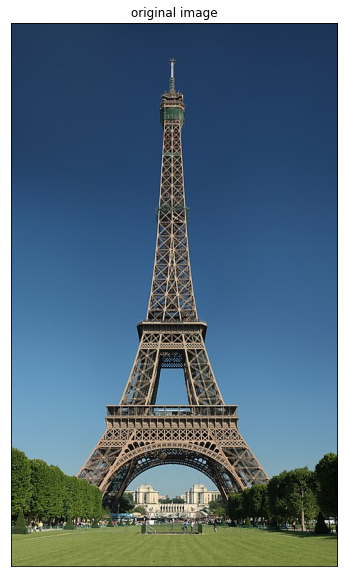

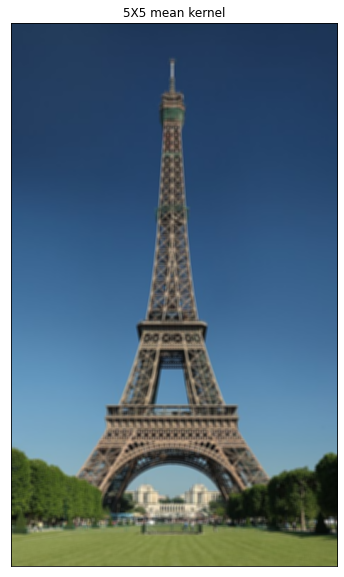

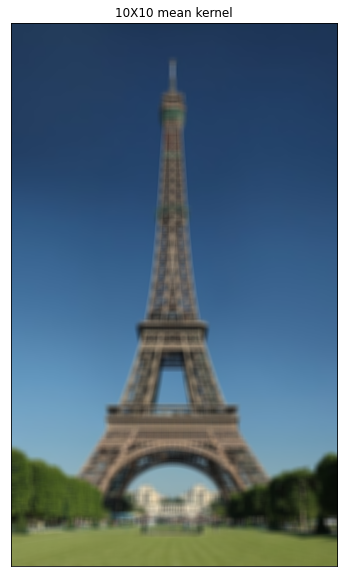

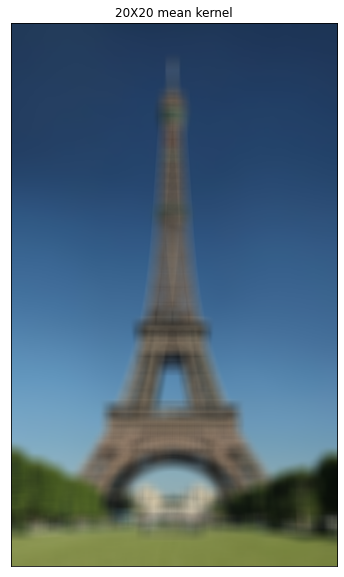

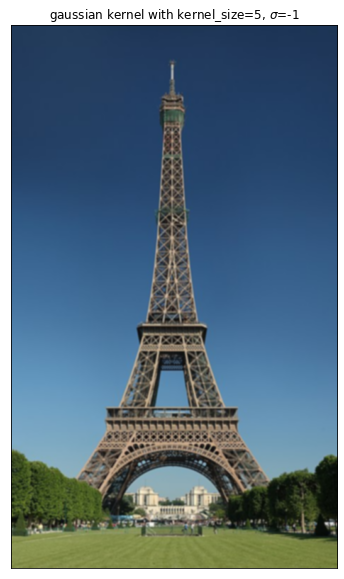

...

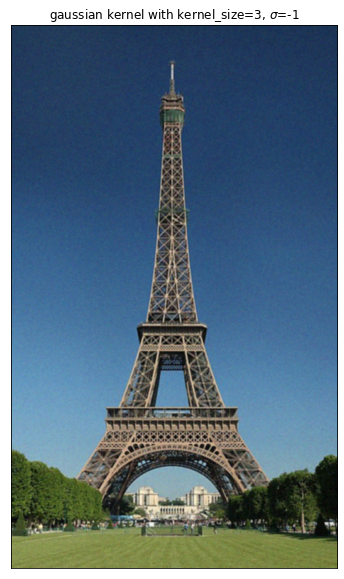

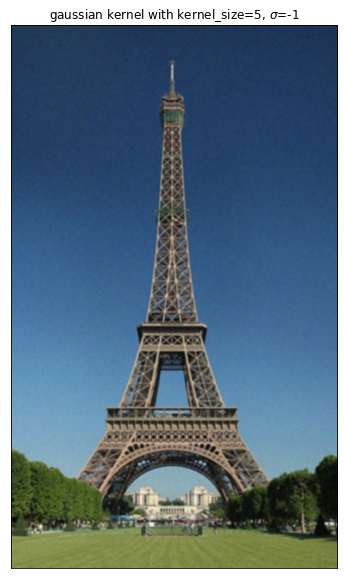

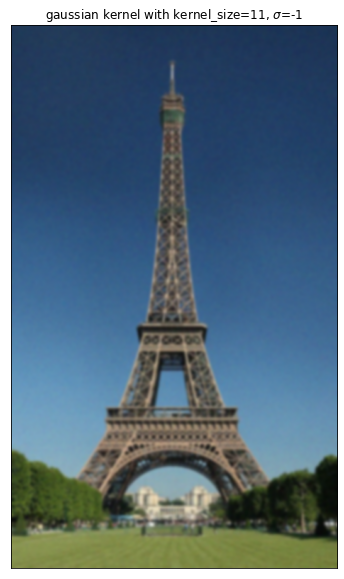

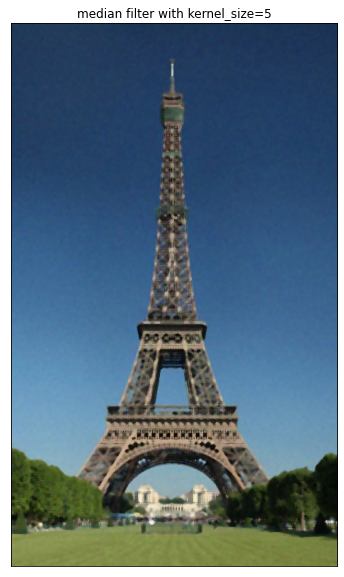

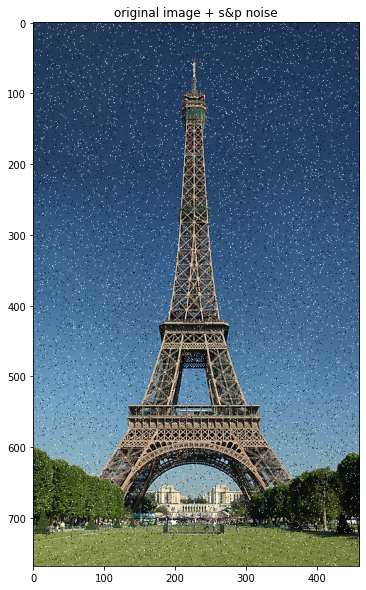

In [2]:
import sys

if "google.colab" in sys.modules:
    import subprocess

    subprocess.call("apt-get install subversion".split())
    subprocess.call(
        "svn export https://github.com/YoniChechik/AI_is_Math/trunk/c_02b_filtering_and_resampling/Tour_Eiffel.jpg".split()
    )
    import numpy as np
import cv2
from matplotlib import pyplot as plt

figsize = (10, 10)
def plot_im(img, title):
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.show()


img = cv2.imread("Tour_Eiffel.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plot_im(img, "original image")
def mean_kernel_smoothing(img, sz):
    kernel = np.ones((sz, sz)) / (sz ** 2)
    dst = cv2.filter2D(img, -1, kernel)

    plot_im(dst, str(sz) + "X" + str(sz) + " mean kernel")


mean_kernel_smoothing(img, 5)
mean_kernel_smoothing(img, 10)
mean_kernel_smoothing(img, 20)
def gauss_blur(img, k_sz, sigma=-1, is_plot_kernel=False):
    blur = cv2.GaussianBlur(img, (k_sz, k_sz), sigma)
    plot_im(blur, "gaussian kernel with kernel_size=" + str(k_sz) + r", $\sigma$=" + str(sigma))
    if is_plot_kernel:
        # sigma=-1 will set the sigma size automatically
        gauss_ker = cv2.getGaussianKernel(k_sz, sigma)
        plt.figure(figsize=(figsize[0] / 2, figsize[1] / 2))
        plt.plot(gauss_ker)
        plt.title("corresponding gaussian kernel")
        plt.show()


gauss_blur(img, 5, is_plot_kernel=True)
gauss_blur(img, 21, is_plot_kernel=True)
gauss_blur(img, 21, 1, is_plot_kernel=True)
def median_filter(img, k_sz):
    res = cv2.medianBlur(img, k_sz)
    plot_im(res, "median filter with kernel_size=" + str(k_sz))


median_filter(img, 5)
def gauss_noise(image, gauss_var=1000):
    mean = 0
    sigma = gauss_var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)

    res = image + gauss
    noisy = np.clip(res, 0, 255).astype(np.uint8)
    return noisy


def s_and_p_noise(image, s_p_ratio=0.04):
    # this implementation is not entirely correct because it assumes that
    # only 0 OR 255 values are S&P noise.
    out = np.copy(image)

    # Salt mode
    mask = np.random.rand(image.shape[0], image.shape[1]) <= s_p_ratio / 2
    out[mask] = 255

    # Pepper mode
    mask = np.random.rand(image.shape[0], image.shape[1]) <= s_p_ratio / 2
    out[mask] = 0
    return out
    np.random.seed(1234)

gauss_noise_im = gauss_noise(img, gauss_var=70)
plt.figure(figsize=figsize)
plt.imshow(gauss_noise_im)
plt.title("original image + gaussian noise")
plt.show()
gauss_blur(gauss_noise_im, 3)
gauss_blur(gauss_noise_im, 5)
gauss_blur(gauss_noise_im, 11)
median_filter(gauss_noise_im, 5)
s_p_noise_im = s_and_p_noise(img, s_p_ratio=0.04)
plt.figure(figsize=figsize)
plt.imshow(s_p_noise_im)
plt.title("original image + s&p noise")
plt.show()

Saving eliana.jpeg to eliana (1).jpeg


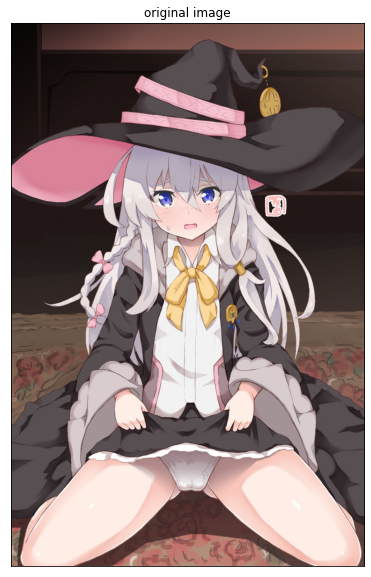

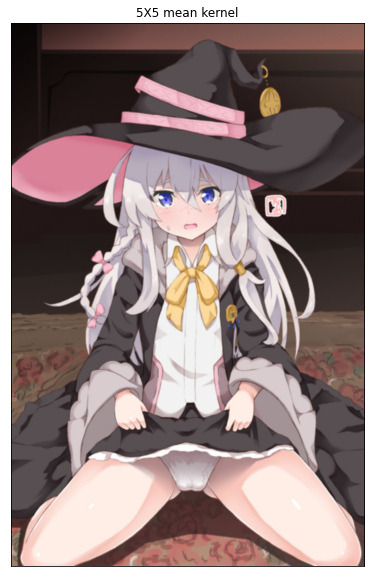

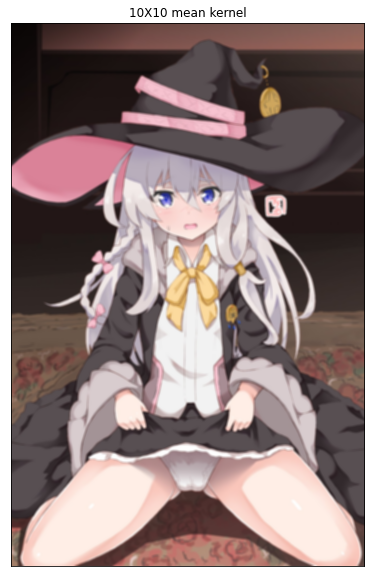

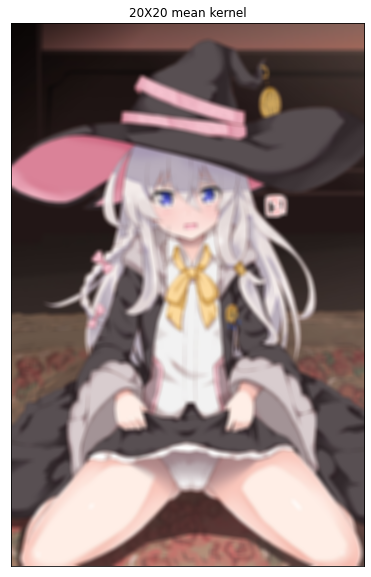

In [3]:
from google.colab import files
file = files.upload()
import numpy as np
import cv2
from matplotlib import pyplot as plt

figsize = (10, 10)
def plot_im(img, title):
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.show()


img = cv2.imread("eliana.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plot_im(img, "original image")
def mean_kernel_smoothing(img, sz):
    kernel = np.ones((sz, sz)) / (sz ** 2)
    dst = cv2.filter2D(img, -1, kernel)

    plot_im(dst, str(sz) + "X" + str(sz) + " mean kernel")


mean_kernel_smoothing(img, 5)
mean_kernel_smoothing(img, 10)
mean_kernel_smoothing(img, 20)

Saving LOM_klein.png to LOM_klein.png


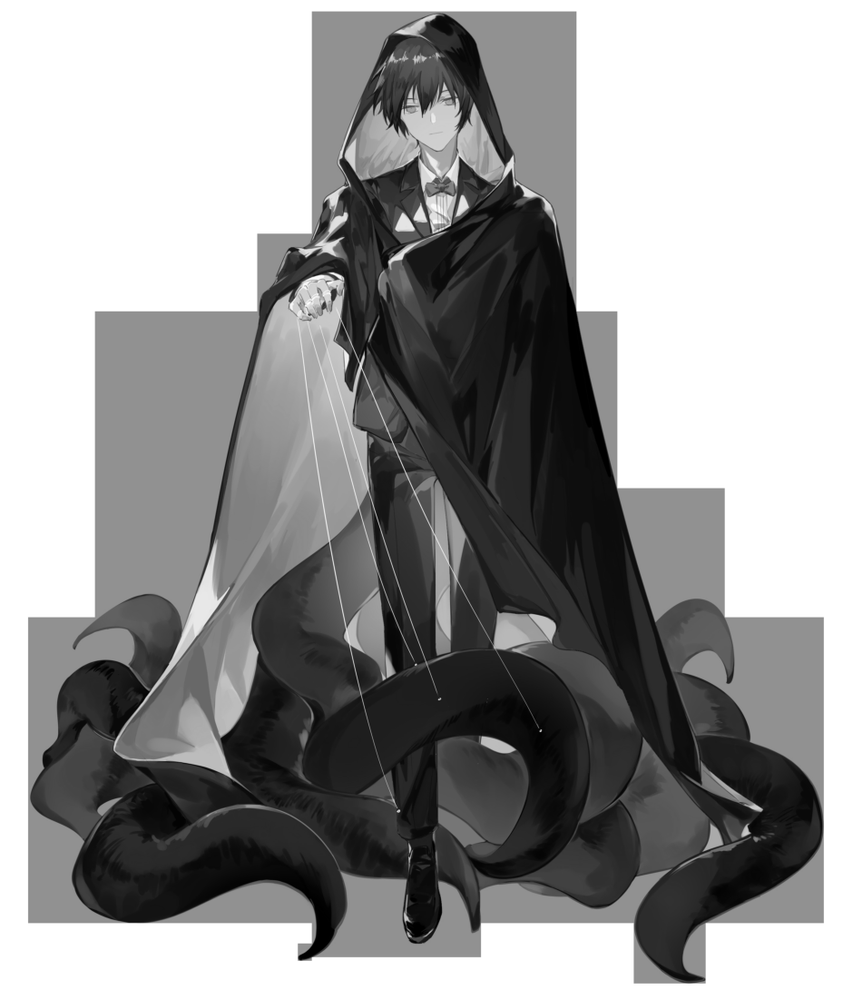

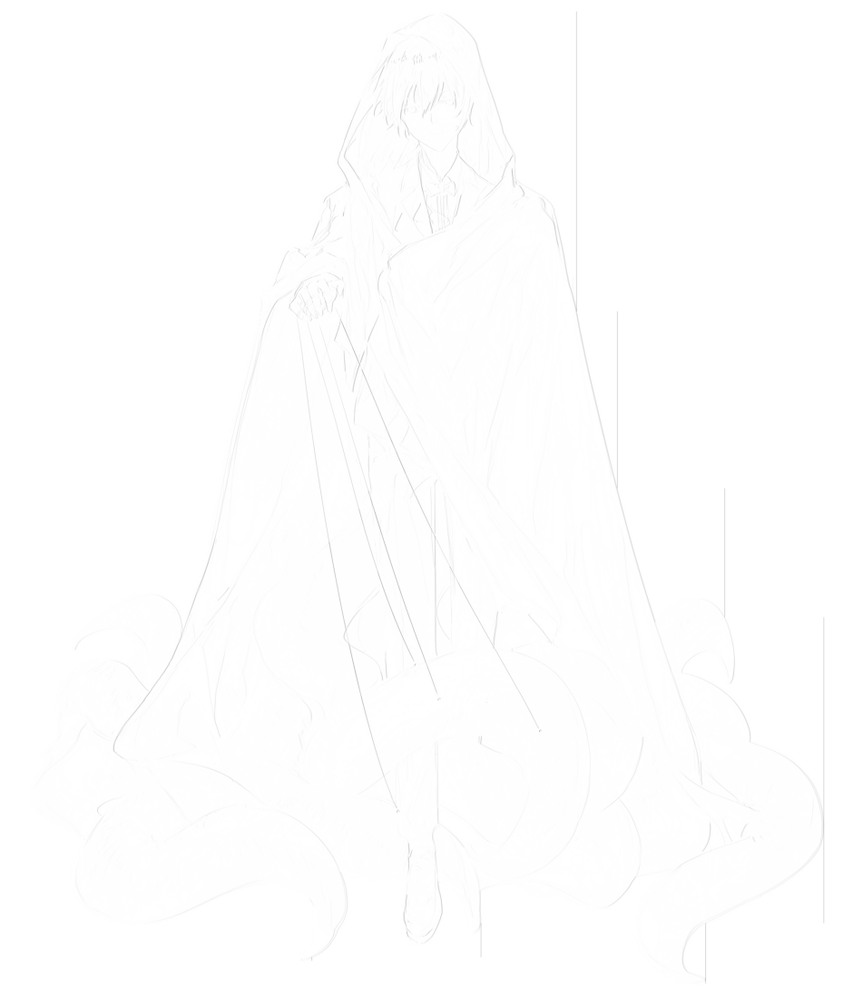

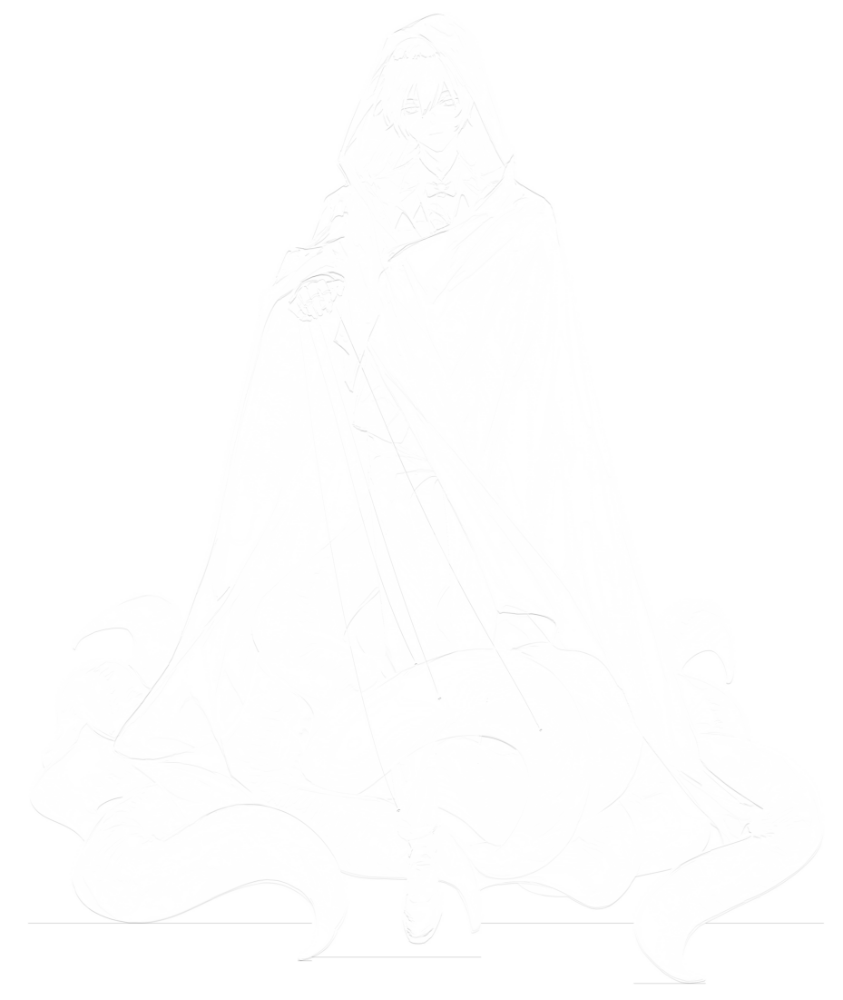

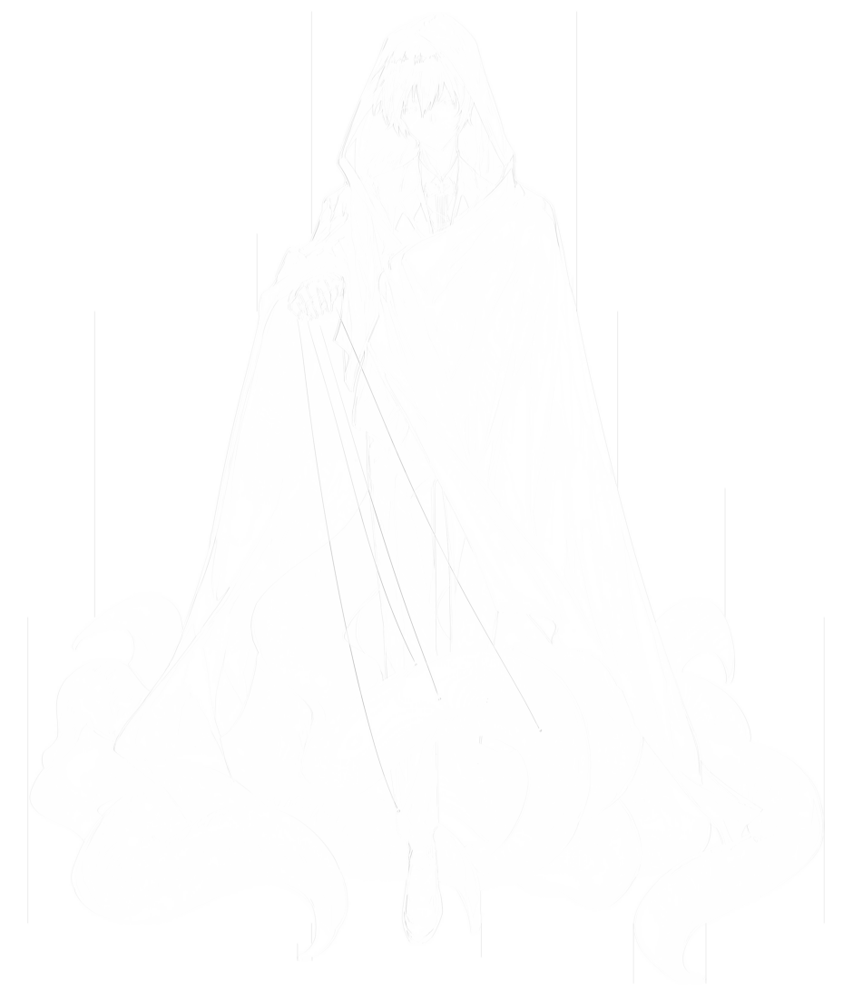

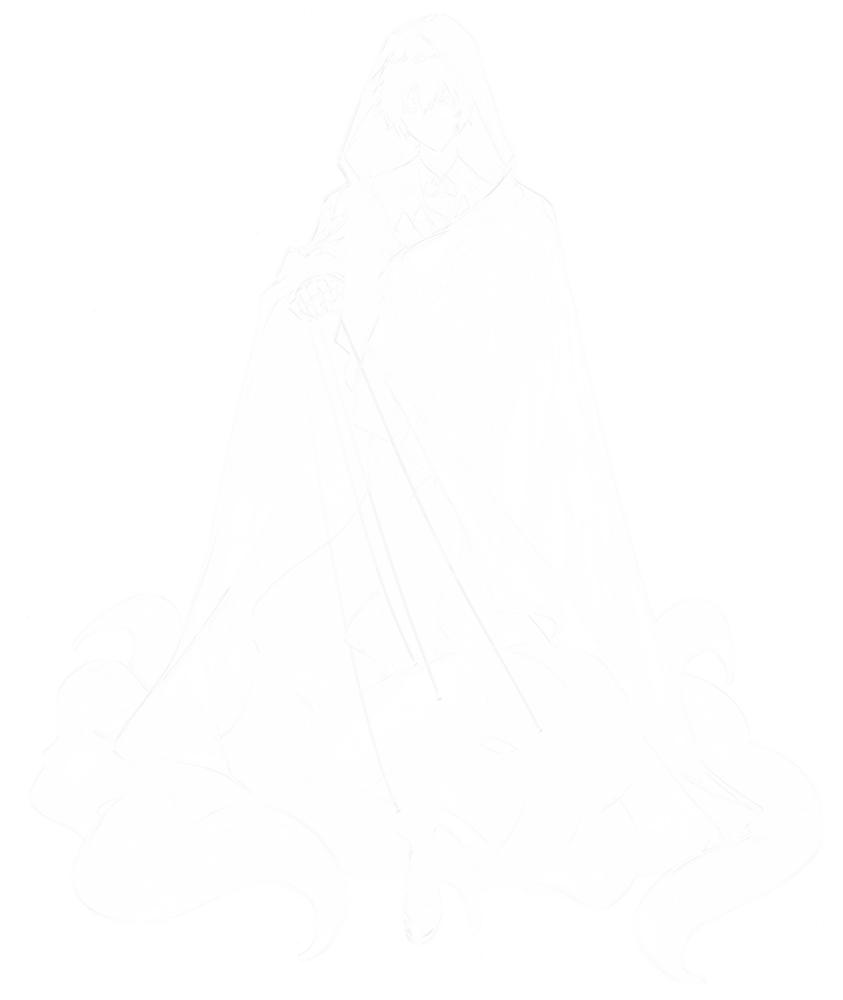

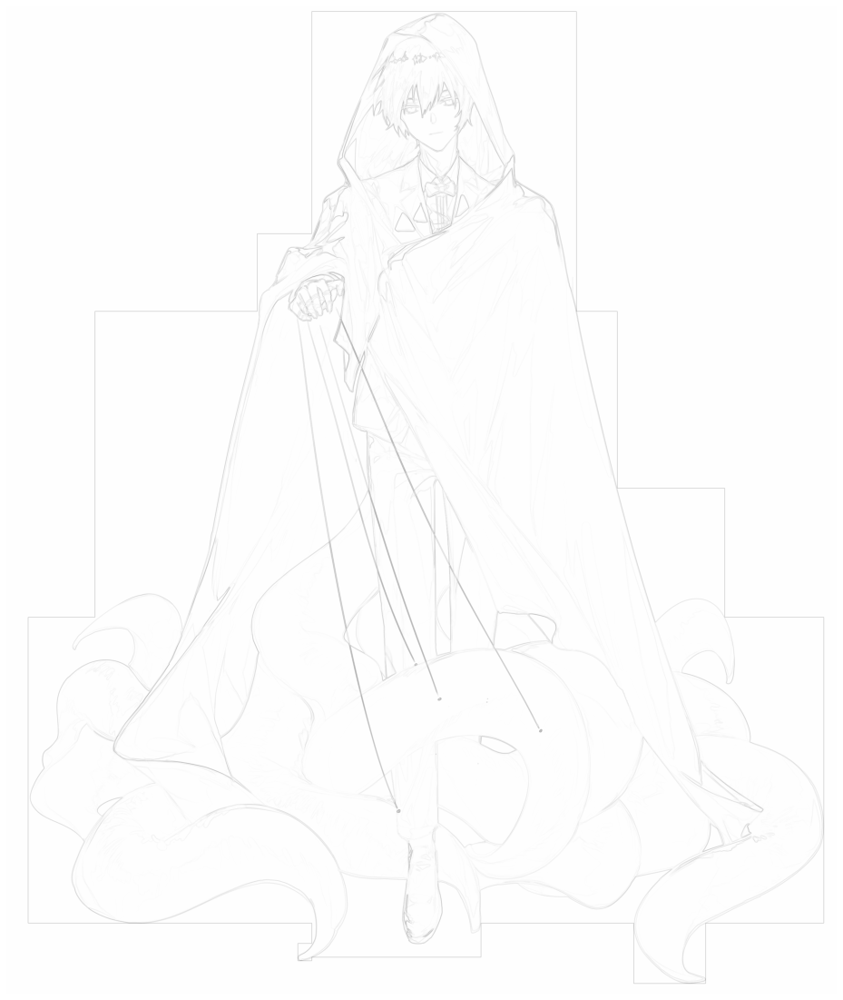

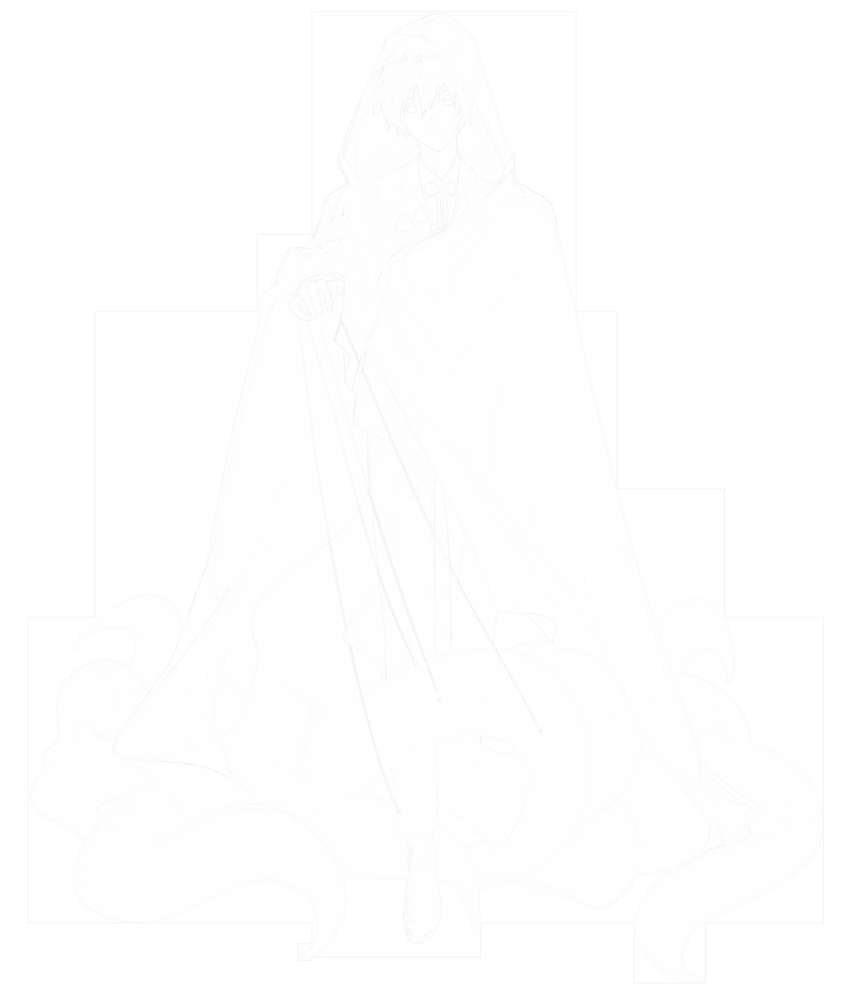

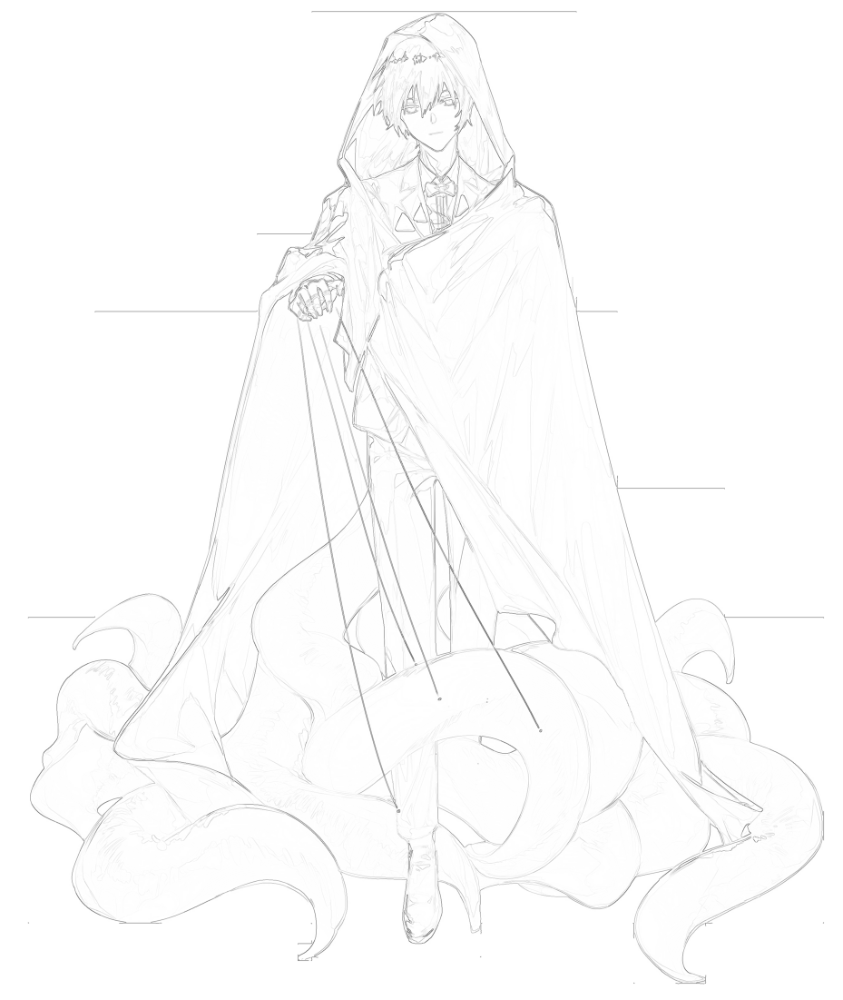

In [11]:
!pip install kornia
import cv2
from matplotlib import pyplot as plt
import numpy as np
from google.colab import files
file = files.upload()
import torch
import torchvision
import kornia as K
img_bgr: np.ndarray = cv2.imread('LOM_klein.png', cv2.IMREAD_COLOR)
x_bgr: torch.Tensor = K.utils.image_to_tensor(img_bgr)  # CxHxWx
x_bgr = x_bgr[None,...].float() / 255.

x_rgb: torch.Tensor = K.color.bgr_to_rgb(x_bgr)
x_gray = K.color.rgb_to_grayscale(x_rgb)
def imshow(input: torch.Tensor):
    out = torchvision.utils.make_grid(input, nrow=2, padding=5)
    out_np: np.ndarray = K.utils.tensor_to_image(out)
    plt.imshow(out_np)
    plt.axis('off')
    plt.show()
imshow(x_gray)
grads: torch.Tensor = K.filters.spatial_gradient(x_gray, order=1)  # BxCx2xHxW
grads_x = grads[:, :, 0]
grads_y = grads[:, :, 1]
# Show first derivatives in x
imshow(1. - grads_x.clamp(0., 1.))
# Show first derivatives in y
imshow(1. - grads_y.clamp(0., 1.))
grads: torch.Tensor = K.filters.spatial_gradient(x_gray, order=2)  # BxCx2xHxW
grads_x = grads[:, :, 0]
grads_y = grads[:, :, 1]
# Show second derivatives in x
imshow(1. - grads_x.clamp(0., 1.))
# Show second derivatives in y
imshow(1. - grads_y.clamp(0., 1.))
x_sobel: torch.Tensor = K.filters.sobel(x_gray)
imshow(1. - x_sobel)
x_laplacian: torch.Tensor = K.filters.laplacian(x_gray, kernel_size=5)
imshow(1. - x_laplacian.clamp(0., 1.))
x_laplacian: torch.Tensor = K.filters.canny(x_gray)[0]
imshow(1. - x_laplacian.clamp(0., 1.))

Saving iqpgmb.jpg to iqpgmb.jpg


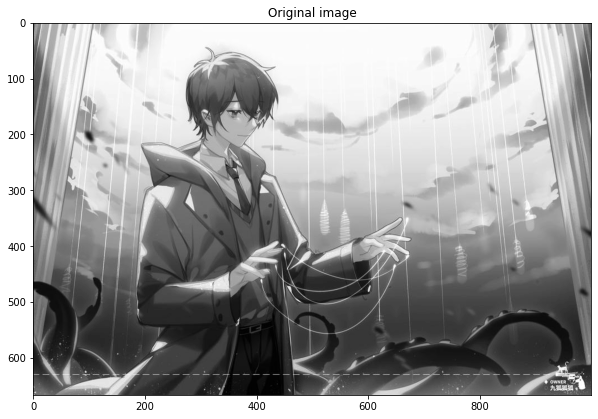

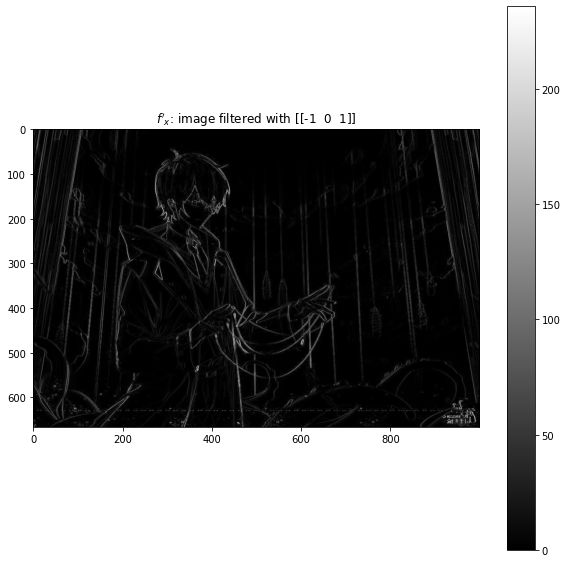

kernel shape is (1, 3)


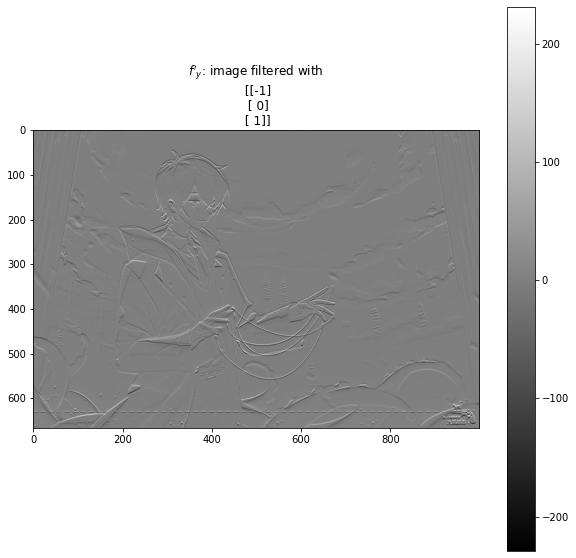

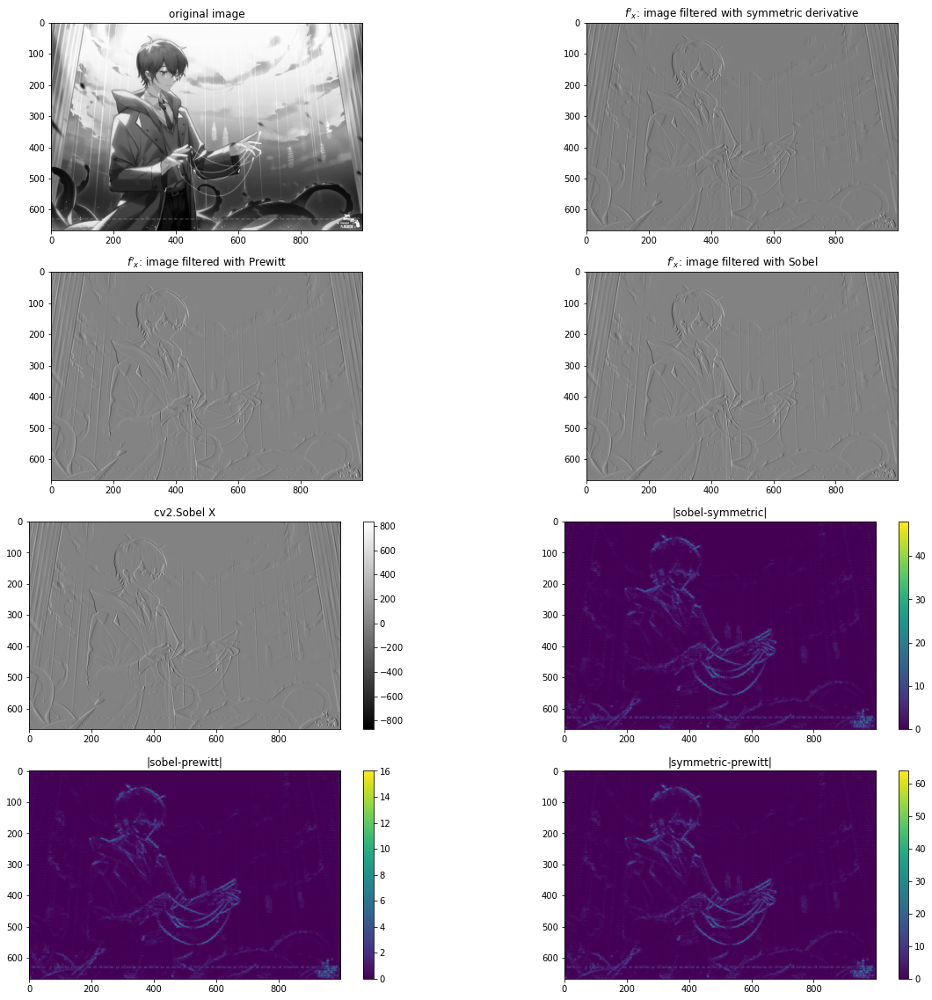

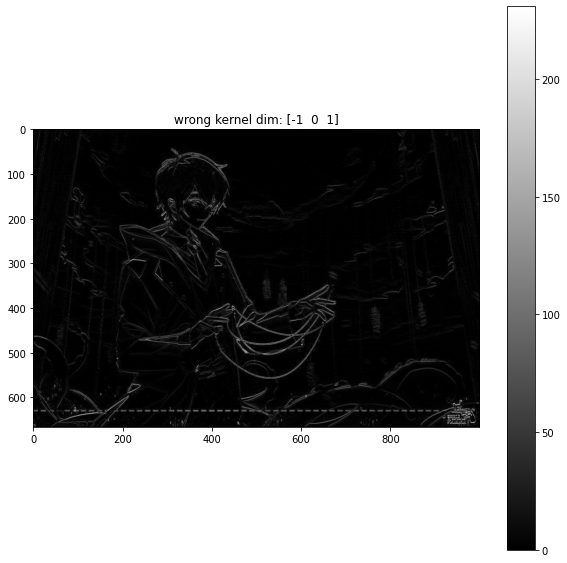

kernel shape is (3,)


In [10]:
from google.colab import files
file = files.upload()
import plotly.io as pio

if (pio.renderers.default != "vscode") & (pio.renderers.default != "colab"):
    pio.renderers.default = "iframe_connected"
import numpy as np
import cv2
from matplotlib import pyplot as plt
import plotly.express as px

figsize = (10, 10)
img = cv2.imread("iqpgmb.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=figsize)
plt.imshow(img, cmap="gray", vmin=0, vmax=255)
plt.title("Original image")
plt.show()
img = img.astype(float)

kernel = 1 / 8 * np.array([[-1, 0, +1], [-2, 0, +2], [-1, 0, +1]])
sobel_x = cv2.filter2D(img, -1, kernel)

kernel = kernel.T
sobel_y = cv2.filter2D(img, -1, kernel)

mag_img = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

phase_img = cv2.phase(sobel_x, -sobel_y, angleInDegrees=True)

phase_img_masked = -100 * np.ones(phase_img.shape)
TH_PRC = 0.15
th = mag_img.max() * TH_PRC
phase_img_masked = phase_img_masked * (mag_img <= th) + phase_img * (mag_img > th)


px.imshow(mag_img, title="Gradient magnitude")
px.imshow(phase_img_masked, title="Gradient phase thresholeded")
kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
dst_LoG = cv2.filter2D(img, -1, kernel)

px.imshow(np.abs(dst_LoG), title="abs LoG")
phase_img_q = phase_img.copy()
for i in range(mag_img.shape[0]):
    for j in range(mag_img.shape[1]):
        phase_img_q[i, j] = np.mod(phase_img_q[i, j] + 22.5, 180)
        phase_img_q[i, j] = (phase_img_q[i, j]) // 45  # integer devider

phase_img_q_masked = -1 * np.ones(phase_img.shape)
TH_PRC = 0.1
th = mag_img.max() * TH_PRC
phase_img_q_masked = phase_img_q_masked * (mag_img <= th) + phase_img_q * (mag_img > th)

px.imshow(phase_img_q_masked, title="Gradient phase- quantized and thresholded")
nms = mag_img.copy()

for i in range(1, mag_img.shape[0] - 1):
    for j in range(1, mag_img.shape[1] - 1):
        if phase_img_q[i, j] == 0 and (mag_img[i, j + 1] > mag_img[i, j] or mag_img[i, j - 1] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 1 and (mag_img[i + 1, j - 1] > mag_img[i, j] or mag_img[i - 1, j + 1] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 2 and (mag_img[i - 1, j] > mag_img[i, j] or mag_img[i + 1, j] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 3 and (mag_img[i - 1, j - 1] > mag_img[i, j] or mag_img[i + 1, j + 1] > mag_img[i, j]):
            nms[i, j] = -50

px.imshow(nms, title="NMS")
nms_th = np.zeros(nms.shape)
TH_l = 3
TH_h = 13
nms_th[nms >= TH_h] = 2
nms_th[np.bitwise_and(TH_l <= nms, nms < TH_h)] = 1

px.imshow(nms_th, title="double TH")
nms_weak_and_strong = np.zeros(nms_th.shape, dtype=bool)
nms_strong = np.zeros(nms_th.shape, dtype=bool)

nms_weak_and_strong[nms_th > 0] = 1
nms_strong[nms_th == 2] = 1

num_w_s_CCs, w_s_CC_mask = cv2.connectedComponents(nms_weak_and_strong.astype(np.uint8))

# for each CC group of weak and strong edge mask
for w_s_CC_i in range(1, num_w_s_CCs):

    # get MASK of weak_and_strong edge from index w_s_CC_i
    w_s_CC_mask_i = np.zeros(nms_th.shape, dtype=bool)
    w_s_CC_mask_i[w_s_CC_mask == w_s_CC_i] = 1

    # if w_s_CC_mask_i has intersection with strong edges mask, add to strong edge mask
    if np.any(np.bitwise_and(w_s_CC_mask_i, nms_strong)):
        nms_strong = np.bitwise_or(w_s_CC_mask_i, nms_strong)

px.imshow(nms_strong, title="Canny final result")
res = cv2.Canny(img.astype(np.uint8), 105, 120)
px.imshow(res, title="cv2.Canny final result")
img = img.astype(float)  # 'uint8' doesn't work with minus sign - for filtering

# 1. cv2.filter2D is working with corelation rether than convolution
#    no need to flip the kernel
# 2. Notice that kernel is 2D array - if 1d than we will get a column vector convolution
kernel = np.array([[-1, 0, +1]])
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(np.abs(dst), cmap='gray')
plt.colorbar()
plt.title('$f\'_x$: image filtered with '+str(kernel))
plt.show()

print("kernel shape is "+str(kernel.shape))
kernel = np.array([[-1, 0, +1]]).T
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(dst, cmap='gray')
plt.colorbar()
plt.title('$f\'_y$: image filtered with\n '+str(kernel))
plt.show()
plt.rcParams['figure.figsize'] = [20, 20]

plt.subplot(4, 2, 1)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.title('original image')

#######################################
kernel = 1/2*np.array([[-1, 0, +1]])
dst_sym = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 2)
plt.imshow(dst_sym, cmap='gray')
plt.title('$f\'_x$: image filtered with symmetric derivative')

#######################################
kernel = 1/6*np.array([
    [-1, 0, +1],
    [-1, 0, +1],
    [-1, 0, +1]])
dst_prewitt = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 3)
plt.imshow(dst_prewitt, cmap='gray')
plt.title('$f\'_x$: image filtered with Prewitt')

#######################################
# cv2.Sobel() also exist
kernel = 1/8*np.array([
    [-1, 0, +1],
    [-2, 0, +2],
    [-1, 0, +1]])
dst_sobel = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 4)
plt.imshow(dst_sobel, cmap='gray')
plt.title('$f\'_x$: image filtered with Sobel')

#######################################
dst_cv2_sobel = cv2.Sobel(img, -1, 1, 0)  #cv2.Sobel(img,ddepth,x_size,y_size)

plt.subplot(4, 2, 5)
plt.imshow(dst_cv2_sobel, cmap='gray')
plt.colorbar()
plt.title('cv2.Sobel X')

#######################################
plt.subplot(4, 2, 6)
plt.imshow(np.abs(dst_sobel-dst_sym))
plt.colorbar()
plt.title('|sobel-symmetric|')

#######################################
plt.subplot(4, 2, 7)
plt.imshow(np.abs(dst_sobel-dst_prewitt))
plt.colorbar()
plt.title('|sobel-prewitt|')

#######################################
plt.subplot(4, 2, 8)
plt.imshow(np.abs(dst_sym-dst_prewitt)) 
plt.colorbar()
plt.title('|symmetric-prewitt|')

plt.show()
kernel = np.array([-1, 0, +1])
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(np.abs(dst), cmap='gray')
plt.colorbar()
plt.title('wrong kernel dim: '+str(kernel))
plt.show()

print("kernel shape is "+str(kernel.shape))

jumlah titik terdeteksi =  640


(<matplotlib.image.AxesImage at 0x7fc3adf7b1d0>,
 <function matplotlib.pyplot.show>)

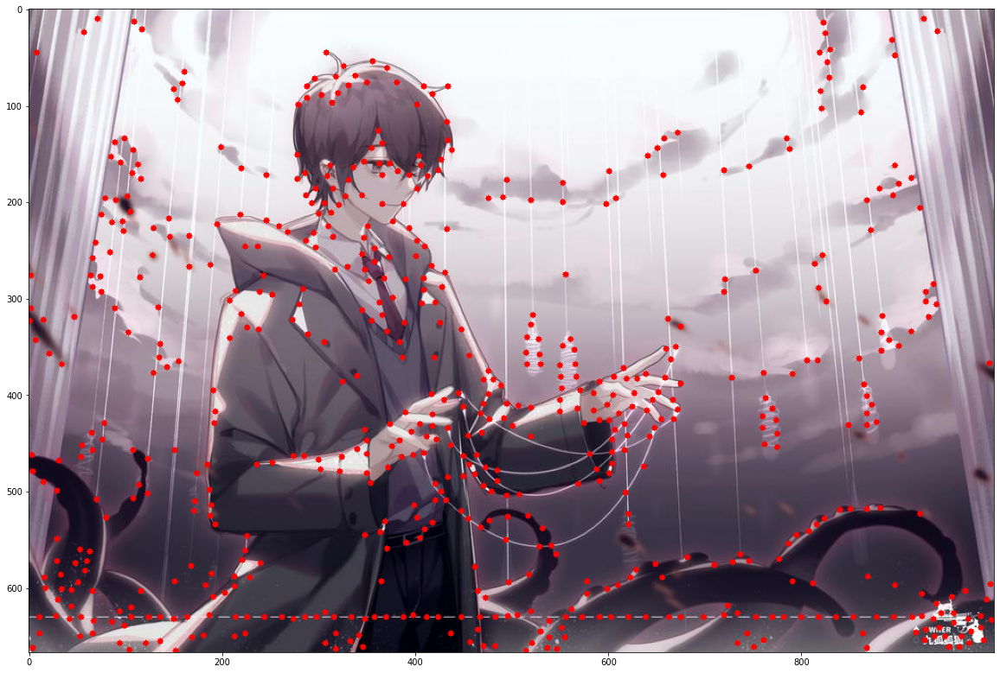

In [17]:
# Menggunakan Shi-Tomasi GFTT untuk deteksi ujung (corner detection)

import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# gunakan gambar yang disediakan di eLOK
img = cv2.imread('iqpgmb.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) 


# deteksi pojok dengan GFTT
corners = cv2.goodFeaturesToTrack(gray,1000,0.01,10)
corners = np.int0(corners)

# menampilkan jumlah titik terdeteksi dengan fungsi numpy (np.ndarray.shape)
print("jumlah titik terdeteksi = ", corners.shape[0])

# untuk ditampilkan di Matplotlib, urutan band dibalik
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (20,20)

# untuk tiap pojok yang terdeteksi, munculkan pada gambar
for i in corners:
    x,y = i.ravel()
    cv2.circle(rgb,(x,y),3,255,-1)
plt.imshow(rgb),plt.show

jumlah titik terdeteksi =  500


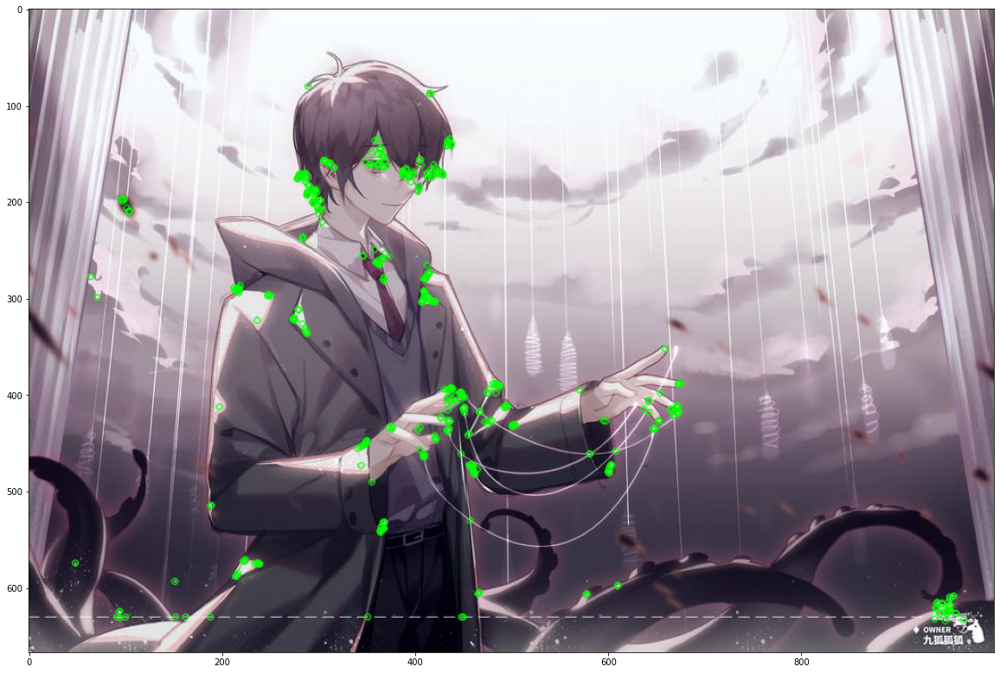

(<matplotlib.image.AxesImage at 0x7fc3ada3bf50>, None)

In [18]:
# Latihan ORB

import numpy as np
import cv2 
from matplotlib import pyplot as plt

# membaca citra
img = cv2.imread('iqpgmb.jpg',0)

# membuat ORB detector
orb = cv2.ORB_create()

# kp: variabel untuk menyimpan keypoint yang berhasil dideteksi
kp = orb.detect(img,None)

# menghitung deskriptor
# kp = keypoints
# des = descriptor
kp, des = orb.compute(img, kp)

# berapa jumlah titik terdeteksi?
print("jumlah titik terdeteksi = ", len(kp))

# menggambar keypoint yang berhasil diidentifikasi 
img2 = cv2.drawKeypoints(img_rgb, kp, None, color=(0,255,0), flags=0)  # img_rbg dari variabel sebelumnya di atas
plt.imshow(img2), plt.show()